<a href="https://colab.research.google.com/github/zafor158/Bangla-Financial-data-Analysis/blob/main/Eda_BanglaFinGpt_Update_abu_zafor.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install wordcloud matplotlib nltk bnltk

  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
# from google.colab import drive
# drive.mount('/content/drive')

In [ ]:
import pandas as pd

# Path to your Excel file
file_path = '/content/BanglaFinGpt_updated.xlsx'

# Read the Excel file
data = pd.read_excel(file_path)

# Display the first few rows of the dataset to understand its structure
data.head()
df=data

In [ ]:
df.Topic.unique()

array(['Customs', 'Tax', 'Vat', 'Finance'], dtype=object)

In [ ]:
df.duplicated().sum()

30

In [ ]:
# Data Overview: Data types and missing values
data_info = data.info()
missing_values = data.isnull().sum()

# Statistical Summary: Summary statistics for numerical fields
statistical_summary = data.describe()

data_info, missing_values, statistical_summary

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10274 entries, 0 to 10273
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   QuestionID  0 non-null      float64
 1   Type        10274 non-null  object 
 2   Topic       10274 non-null  object 
 3   Context     10274 non-null  object 
 4   Question    10274 non-null  object 
 5   Answer      10274 non-null  object 
dtypes: float64(1), object(5)
memory usage: 481.7+ KB


(None,
 QuestionID    10274
 Type              0
 Topic             0
 Context           0
 Question          0
 Answer            0
 dtype: int64,
        QuestionID
 count         0.0
 mean          NaN
 std           NaN
 min           NaN
 25%           NaN
 50%           NaN
 75%           NaN
 max           NaN)

# 1.Language Distribution by Topic

The "Language Distribution by Topic" chart shows the even distribution of English and Bangla across the selected financial topics of Customs, Finance, Tax, and VAT. There is a dominant presence of English and Bangla languages within the groups of understudy where each individual portion does not surpass 50%. With this explanation, for the Customs topic, there are 1,724 instances of English and Bangla combined. For Finance, the same thing is true as there are 772 such instances for each language. In the case of Tax, it was 1,331, and for VAT, 1,310 as well. Though the overall distribution remains the same, minor variations may exist at the forefront level wherein specific topic such phrases or terms would only be additional in regards to one language rather than the other depending on the background or sub-topic.



In [ ]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sample DataFrame structure (replace with your actual dataset)
# Assuming the dataset is already loaded as a pandas DataFrame named 'df'
# Columns: ['QuestionID', 'Type', 'Topic', 'Context', 'Question', 'Answer']

# Sample data loading (replace with your actual data file)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and replace with actual path

# Group by Topic and Type (Language) and count occurrences
language_distribution = df.groupby(['Topic', 'Type']).size().reset_index(name='Count')

# Pivot the table to get 'Type' as columns
pivot_table = language_distribution.pivot(index='Topic', columns='Type', values='Count').fillna(0)

# Define standard colors for Bangla and English
colors = ['#1f77b4', '#ff7f0e']  # Blue for Bangla, Orange for English

# Calculate number of rows and columns needed for subplots
num_topics = len(pivot_table.index)
cols = (num_topics + 1) // 2
rows = (num_topics + cols - 1) // cols  # Round up to ensure enough rows

# Create subplots: Dynamic number of rows and columns
fig = make_subplots(rows=rows, cols=cols, specs=[[{'type': 'domain'}] * cols] * rows, subplot_titles=pivot_table.index)

# Custom function to format pie chart labels with count and percentage
def autopct_format(values):
    total = sum(values)
    return [f'{v} ({v / total * 100:.1f}%)' for v in values]

# Plotting pie charts for each topic
for i, topic in enumerate(pivot_table.index):
    # Data for the current topic
    data = pivot_table.loc[topic]

    # Add pie chart for the current topic
    row = i // cols + 1
    col = i % cols + 1
    fig.add_trace(
        go.Pie(
            labels=data.index,
            values=data.values,
            marker=dict(colors=colors),
            hoverinfo='label+value+percent',
            textinfo='label+value+percent'
        ),
        row=row, col=col
    )

# Update layout and titles
fig.update_layout(
    title_text="Language Distribution by Topic",
    title_x=0.5,
    height=800,
    showlegend=True,  # Set to True to show legends
    legend_title_text='Language'
)

# Display the figure
fig.show()


#2.Context Length vs Answer Quality
In the diagram "Bangla: Context Length vs. Answer Length" and "English: Context Length vs. Answer Length" visually depict the relationship between the length of the context  and the length of the answer  for both Bangla and English. Each scatter plot represents pairs of context and answer lengths, with the x-axis showing context length and the y-axis indicating answer length . Both plots reveal a general positive correlation, suggesting that longer contexts usually result in longer answers. However, the strength and nature of this correlation vary between the two languages, with some instances showing a non-linear relationship where longer contexts do not always lead to proportionally longer answers, and shorter contexts may sometimes produce more extensive responses. Additionally, both plots feature outliers—data points that deviate significantly from the general trend—possibly due to factors such as topic complexity, query ambiguity, or specific characteristics of the input text. These diagrams provide valuable insights into how context length influences answer length in language models, highlighting differences in processing between Bangla and English and contributing to discussions on the limitations and challenges of current language models.

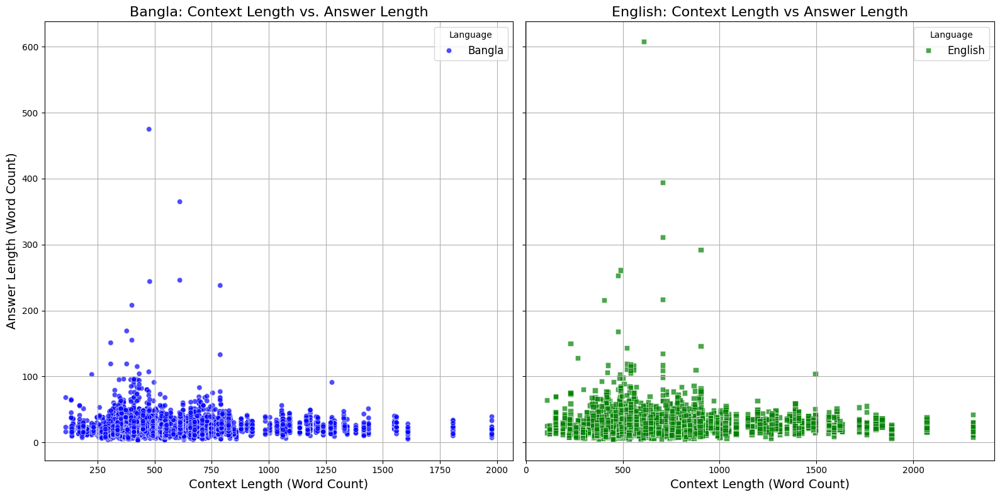

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sample DataFrame structure (replace with your actual dataset)
# Assuming the dataset is already loaded as a pandas DataFrame named 'df'
# Columns: ['QuestionID', 'Type', 'Topic', 'Context', 'Question', 'Answer']

# Sample data loading (replace with your actual data file)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and replace with actual path

# Calculate context length and answer length (using word count as an example)
df['Context_Length'] = df['Context'].apply(lambda x: len(str(x).split()))  # Word count of question
df['Answer_Length'] = df['Answer'].apply(lambda x: len(str(x).split()))    # Word count of answer

# Create subplots for Bangla and English
fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

# Define color palette and markers
palette = {'Bangla': 'blue', 'English': 'green'}
markers = {'Bangla': 'o', 'English': 's'}

# Plot for Bangla
bangla_data = df[df['Type'] == 'Bangla']
sns.scatterplot(
    x='Context_Length',
    y='Answer_Length',
    hue='Type',
    style='Type',
    data=bangla_data,
    palette=palette,
    markers=markers,
    alpha=0.7,
    ax=axes[0]  # Plot on the first axis
)
axes[0].set_title('Bangla: Context Length vs. Answer Length', fontsize=16)
axes[0].set_xlabel('Context Length (Word Count)', fontsize=14)
axes[0].set_ylabel('Answer Length (Word Count)', fontsize=14)
axes[0].grid(True)
axes[0].legend(title='Language', fontsize=12)

# Plot for English
english_data = df[df['Type'] == 'English']
sns.scatterplot(
    x='Context_Length',
    y='Answer_Length',
    hue='Type',
    style='Type',
    data=english_data,
    palette=palette,
    markers=markers,
    alpha=0.7,
    ax=axes[1]  # Plot on the second axis
)
axes[1].set_title('English: Context Length vs Answer Length', fontsize=16)
axes[1].set_xlabel('Context Length (Word Count)', fontsize=14)
axes[1].set_ylabel('Answer Length (Word Count)', fontsize=14)
axes[1].grid(True)
axes[1].legend(title='Language', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


#3.Question Length vs Answer Quality

The diagram “Bangla: Answer Length vs Context Length” and “English: Answer Length vs Context Length” represent how the answer length depends on the context length  for both bangla and English respectively. Each scatter plot pairs the context length with one answer length plot whereas the x-axis indicates the context length in terms of word count and the y-axis corresponds to the answer length in terms of word count. Both plots give an insight into a general correlation where both contexts and answers are relatively increasing depending on how the context has been set up. What differs is quite how strong and the direction of the correlation between the languages. For some others the relationship is not linear where the longer the contexts the more the answers however other shorter contexts seem to elicit longer answers. Both scatter plots also have outliers – data points that are not in the line with the pattern that the scatter plot exhibits that may be explained by either the topic of the input and the query or the text introduced. Studying these diagrams is useful in understanding how the length of content affects the length of the response generated by language models for Bangla and English, as they point out areas of differences in how the two languages are processed, and contribute to the debate about the current and future limits and problems of language models.

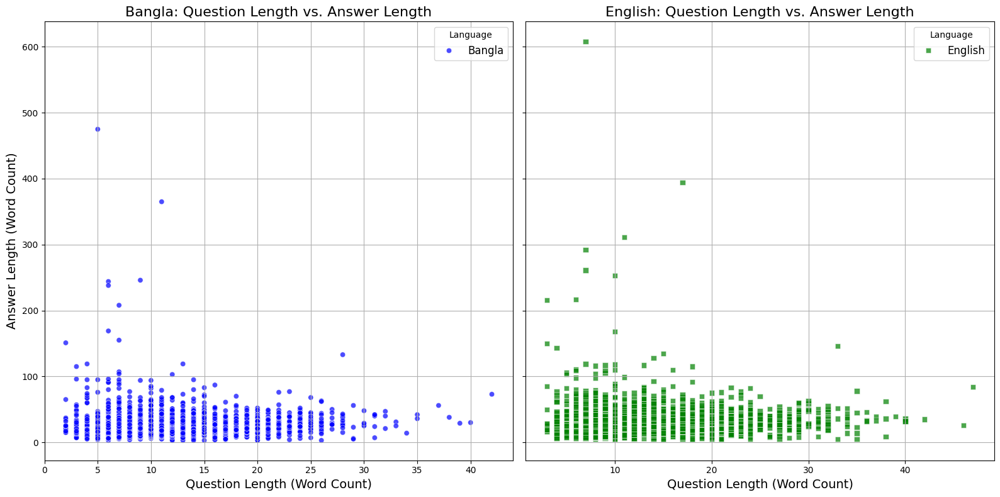

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Sample DataFrame structure (replace with your actual dataset)
# Assuming the dataset is already loaded as a pandas DataFrame named 'df'
# Columns: ['QuestionID', 'Type', 'Topic', 'Context', 'Question', 'Answer']

# Sample data loading (replace with your actual data file)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and replace with actual path

# Calculate context length and answer length (using word count as an example)
df['Question_Length'] = df['Question'].apply(lambda x: len(str(x).split()))  # Word count of question
df['Answer_Length'] = df['Answer'].apply(lambda x: len(str(x).split()))    # Word count of answer

# Create subplots for Bangla and English
fig, axes = plt.subplots(1, 2, figsize=(16, 8), sharey=True)

# Define color palette and markers
palette = {'Bangla': 'blue', 'English': 'green'}
markers = {'Bangla': 'o', 'English': 's'}

# Plot for Bangla
bangla_data = df[df['Type'] == 'Bangla']
sns.scatterplot(
    x='Question_Length',
    y='Answer_Length',
    hue='Type',
    style='Type',
    data=bangla_data,
    palette=palette,
    markers=markers,
    alpha=0.7,
    ax=axes[0]  # Plot on the first axis
)
axes[0].set_title('Bangla: Question Length vs. Answer Length', fontsize=16)
axes[0].set_xlabel('Question Length (Word Count)', fontsize=14)
axes[0].set_ylabel('Answer Length (Word Count)', fontsize=14)
axes[0].grid(True)
axes[0].legend(title='Language', fontsize=12)

# Plot for English
english_data = df[df['Type'] == 'English']
sns.scatterplot(
    x='Question_Length',
    y='Answer_Length',
    hue='Type',
    style='Type',
    data=english_data,
    palette=palette,
    markers=markers,
    alpha=0.7,
    ax=axes[1]  # Plot on the second axis
)
axes[1].set_title('English: Question Length vs. Answer Length', fontsize=16)
axes[1].set_xlabel('Question Length (Word Count)', fontsize=14)
axes[1].set_ylabel('Answer Length (Word Count)', fontsize=14)
axes[1].grid(True)
axes[1].legend(title='Language', fontsize=12)

# Adjust layout
plt.tight_layout()
plt.show()


# **4.Question Complexity Analysis**

Violin plots are used in the diagram  "Question Complexity by Language" to show how questions in Bangla and English differ in terms of word count and unique phrases. The question word count distribution for both languages is depicted in the left violin plot, which indicates a noticeable overlap between the two distributions despite the fact that the median word count for Bangla questions is marginally greater than that of English questions. The distribution of unique terms used in questions is seen in the right violin plot; in general, English questions have a greater median number of unique terms than Bangla ones. In spite of these variations, there is a general pattern in both languages where the majority of the questions fall into a particular word count and unique keyword range,but also include a tail of longer and more complex questions. This analysis provides valuable insights into the variations in question complexity between Bangla and English, highlighting key differences and challenges for language models.

In [ ]:
import pandas as pd
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Sample DataFrame structure (replace with your actual dataset)
# Assuming the dataset is already loaded as a pandas DataFrame named 'df'
# Columns: ['QuestionID', 'Type', 'Topic', 'Context', 'Question', 'Answer']

# Sample data loading (replace with your actual data file)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and replace with actual path

# Calculate complexity metrics
df['Word_Count'] = df['Question'].apply(lambda x: len(str(x).split()))
df['Unique_Terms'] = df['Question'].apply(lambda x: len(set(str(x).split())))

# Create subplots: 1 row and 2 columns for two violin plots
fig = make_subplots(rows=1, cols=2, subplot_titles=['Question Word Count by Language', 'Question Unique Terms by Language'])

# Violin plot for Word Count
fig.add_trace(
    go.Violin(
        x=df['Type'],
        y=df['Word_Count'],
        box_visible=True,
        line_color='blue',
        meanline_visible=True,
        fillcolor='lightblue',
        opacity=0.6,
        name='Word Count'
    ),
    row=1, col=1
)

# Violin plot for Unique Terms
fig.add_trace(
    go.Violin(
        x=df['Type'],
        y=df['Unique_Terms'],
        box_visible=True,
        line_color='green',
        meanline_visible=True,
        fillcolor='lightgreen',
        opacity=0.6,
        name='Unique Terms'
    ),
    row=1, col=2
)

# Update layout
fig.update_layout(
    title_text="Question Complexity by Language",
    title_x=0.5,
    height=600,
    width=1000,
    showlegend=False
)

# Update axis labels for both subplots
fig.update_xaxes(title_text='Language', row=1, col=1)
fig.update_yaxes(title_text='Word Count', row=1, col=1)
fig.update_xaxes(title_text='Language', row=1, col=2)
fig.update_yaxes(title_text='Unique Terms', row=1, col=2)

# Display the plot
fig.show()


# **5.Answer Confidence Analysis by Topic**(Not included)


**Visualization:** Box plot or density plot showing confidence scores (if available or use proxy metrics like answer length) for answers grouped by topic.

**Insight**: Determine which topics tend to have more confident or detailed answers, indicating the clarity of the generated responses.


---




In the diagram, titled "Answer Confidence by Topic (Answer Length)," visually represents the distribution of answer lengths  across four different topics: Customs, Finance, Tax, and VAT.

Key Observations:

1.  Box Plots: The image uses box plots to depict the distribution of answer lengths for each topic. Box plots provide a summary of the data, including the median, quartiles, and potential outliers.

2.  Topic-Specific Distributions: The box plots show distinct distributions of answer lengths for each topic.

     * Customs: The distribution has a median around 100 word count, with a relatively small spread of data points.

     *  Finance: The distribution has a median around 150 word count, with a slightly larger spread compared to Customs.

     *  Tax: The distribution has a median around 100 word count, with a wide range of answer lengths, including several outliers.

     *  VAT: The distribution has a median around 100 word count, with a moderate spread of data points.

    *  Outliers: The box plots reveal several outliers, particularly in the Tax topic. Outliers are data points that deviate significantly from the overall distribution, potentially indicating unusual or exceptional cases.

The information from the diagram can be incorporated on language modeling or natural language processing. It provides insights into the relationship between answer length and topic, suggesting that the complexity of the topic or the availability of relevant information might influence the length of the generated answers





In [ ]:
import pandas as pd
import plotly.express as px

# Sample DataFrame structure (replace with your actual dataset)
# Assuming the dataset is already loaded as a pandas DataFrame named 'df'
# Columns: ['QuestionID', 'Type', 'Topic', 'Context', 'Question', 'Answer']

# Sample data loading (replace with your actual data file)
# df = pd.read_csv('your_dataset.csv')  # Uncomment and replace with actual path

# Calculate answer length as a proxy for confidence
df['Answer_Length'] = df['Answer'].apply(lambda x: len(str(x).split()))

# Plotting the box plot using Plotly
fig = px.box(
    df,
    x='Topic',
    y='Answer_Length',
    title='Answer Confidence by Topic (Answer Length)',
    labels={'Topic': 'Topic', 'Answer_Length': 'Answer Length (Word Count)'},
    color='Topic',
    template='plotly_white'
)

# Customize the layout for better readability
fig.update_layout(
    xaxis_title='Topic',
    yaxis_title='Answer Length (Word Count)',
    xaxis_tickangle=-45,  # Rotate x-axis labels
    showlegend=False,
    title_x=0.5  # Center the title
)

# Display the plot
fig.show()

#6.Distribution of Question, Answer and Context Length

The diagram depicts the distribution of lengths for questions, answers, and contexts within a dataset. The three histograms show that questions are generally shorter than answers, while contexts vary widely in length. Most questions have lengths around 100 characters, while answers tend to be significantly longer, with a peak around 1000 characters. Contexts exhibit a more uniform distribution, with a peak around 5000 characters.

In [ ]:
import pandas as pd
import plotly.graph_objects as go
from plotly.subplots import make_subplots

# Load the data (replace with your actual data file)
data = pd.read_excel('/content/BanglaFinGpt_updated.xlsx')

# Calculate the length of each text column
data['QuestionLength'] = data['Question'].apply(len)
data['AnswerLength'] = data['Answer'].apply(len)
data['ContextLength'] = data['Context'].apply(len)

# Create subplots: 1 row and 3 columns
fig = make_subplots(
    rows=1, cols=3,
    subplot_titles=['Question Lengths', 'Answer Lengths', 'Context Lengths']
)

# Define trace properties for reuse
hist_props = [
    ('QuestionLength', 'lightcoral', 'Question Length'),
    ('AnswerLength', 'teal', 'Answer Length'),
    ('ContextLength', 'orchid', 'Context Length')
]

# Add histograms for each column
for i, (col, color, name) in enumerate(hist_props):
    fig.add_trace(
        go.Histogram(
            x=data[col],
            nbinsx=30,
            name=name,
            marker_color=color
        ),
        row=1, col=i+1
    )

# Update layout
fig.update_layout(
    title_text="Distribution of Lengths for Questions, Answers, and Contexts",
    title_x=0.5,
    plot_bgcolor='white',
    bargap=0.1,
    showlegend=False
)

# Update x-axis and y-axis labels for all subplots
for i in range(1, 4):
    fig.update_xaxes(title_text='Length (Characters)', row=1, col=i)
    fig.update_yaxes(title_text='Frequency', row=1, col=i)

# Display the figure
fig.show()


#Word Cloud

In [ ]:
pip install pandas openpyxl


In [ ]:
import pandas as pd
import re

# Function to remove characters from specified ranges inside (), {}, or [] including spaces within brackets
def exclude_pattern(text):
    # Regex pattern to match characters inside (), {}, or [] with optional spaces
    pattern = r'[\(\{\[]\s*([a-zA-Z1-9১-১০অ-ঔক-য়]*)\s*[\)\}\]]'
    return re.sub(pattern, '', text)
file_path='/content/BanglaFinGpt_updated.xlsx'
# Load the Excel file
def load_and_clean_excel(file_path, sheet_name=0):
    # Read the Excel file
    df = pd.read_excel(file_path, sheet_name=sheet_name)

    # Create a new DataFrame with the excluded terms
    clean_df = df.applymap(lambda x: exclude_pattern(str(x)) if isinstance(x, str) else x)

    return clean_df

# Example usage
if __name__ == "__main__":
    file_path = "/content/BanglaFinGpt_updated.xlsx"  # Path to your Excel file
    cleaned_df = load_and_clean_excel(file_path)

    # Save the cleaned dataframe to a new Excel file (optional)
    cleaned_df.to_excel("cleaned_dataset.xlsx", index=False)

    # Print the cleaned dataframe
    print(cleaned_df)


<ipython-input-8-cfd67ac21c71>:16: FutureWarning:

DataFrame.applymap has been deprecated. Use DataFrame.map instead.



       QuestionID     Type    Topic  \
0             NaN   Bangla  Customs   
1             NaN  English  Customs   
2             NaN   Bangla  Customs   
3             NaN  English  Customs   
4             NaN   Bangla  Customs   
...           ...      ...      ...   
10269         NaN  English  Finance   
10270         NaN   Bangla  Finance   
10271         NaN  English  Finance   
10272         NaN   Bangla  Finance   
10273         NaN  English  Finance   

                                                 Context  \
0       সংক্ষিপ্ত শিরোনাম ও প্রবর্তন ১ এই আইন কাস্টমস...   
1       Short title and introduction  This Act shall ...   
2       সংক্ষিপ্ত শিরোনাম ও প্রবর্তন ১ এই আইন কাস্টমস...   
3       Short title and introduction  This Act shall ...   
4       সংক্ষিপ্ত শিরোনাম ও প্রবর্তন ১ এই আইন কাস্টমস...   
...                                                  ...   
10269  Individuals trusts funds and companies to whom...   
10270  সংঘবদ্ধ ব্যক্তিঘ ট্রাস্ট তাহবিল এবং কোম্পানি

# Word cloud trigram for Questions (details no need)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


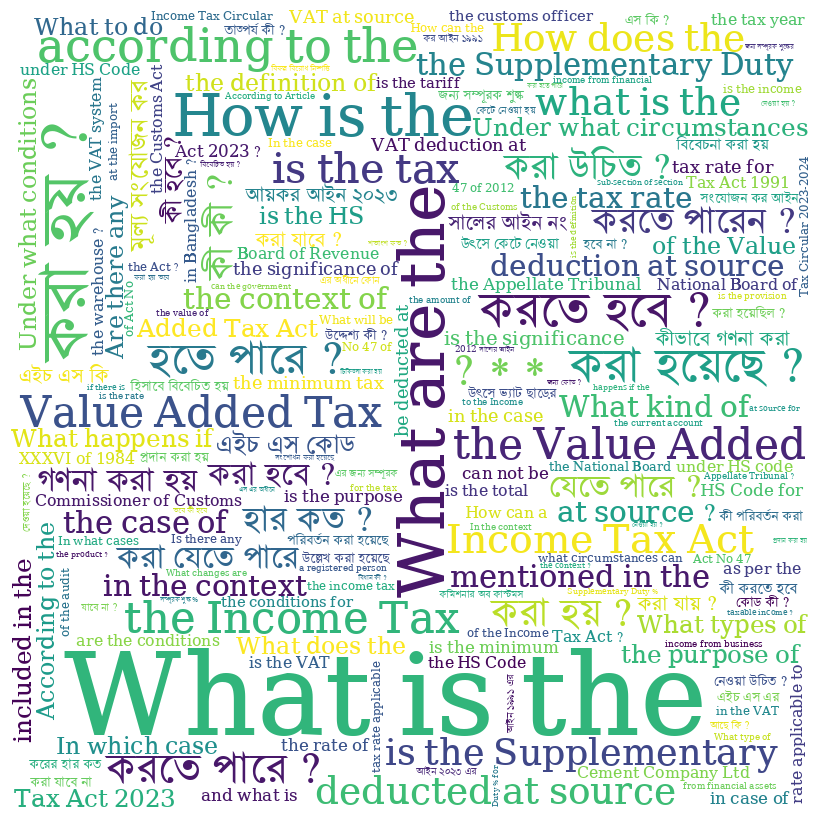

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Tokenizing the reviews into words
tokens = [nltk.word_tokenize(question) for question in cleaned_df['Question'].dropna()]

# Generating trigrams for each tokenized review
trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

# Flattening the list of trigrams and converting each trigram tuple to a string
flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

# Counting the frequency of each trigram
trigram_frequency = Counter(flat_trigrams)

# Creating a word cloud from the trigram frequencies
wordcloud = WordCloud(width = 800, height = 800,
                      stopwords = set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
                      font_path="/content/Nikosh.ttf",
                      background_color ='white').generate_from_frequencies(trigram_frequency)

# Plotting the word cloud
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()


# English-Bangla Separated word cloud Trigrams for Questions (details no need)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


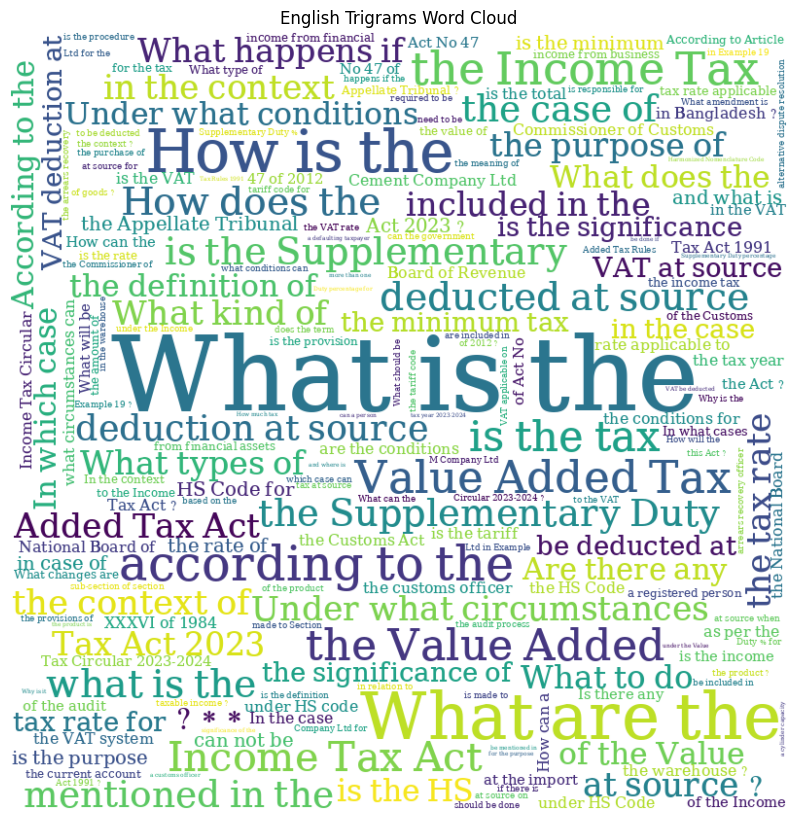

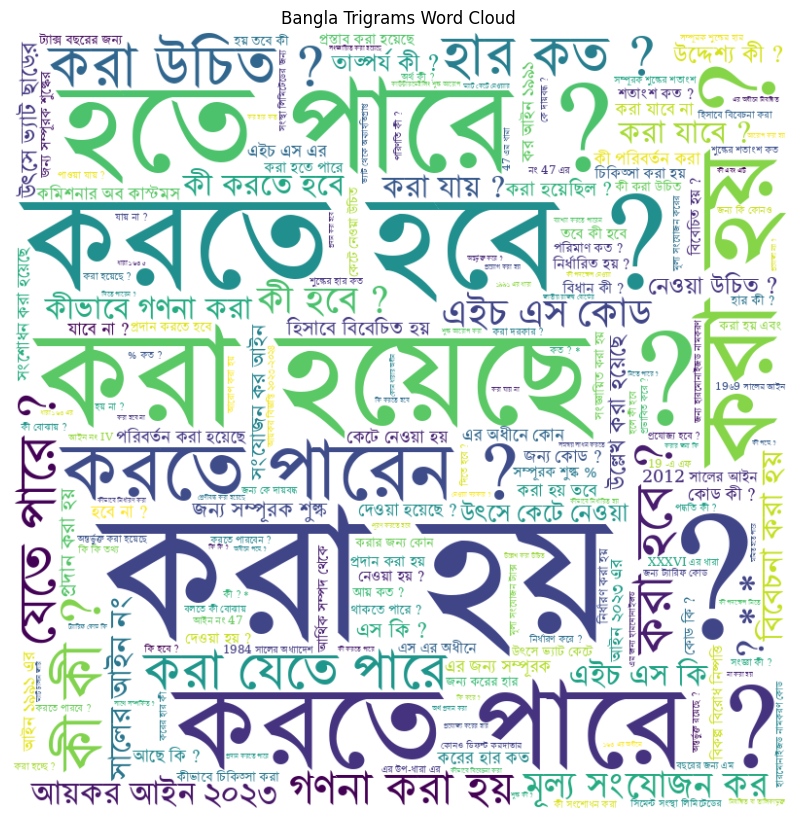

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Sample data loading (replace with your actual data loading method)
# data = pd.read_excel('/content/drive/MyDrive/Bangla FinGpt.xlsx')

# Example columns: 'Question' for text and 'Language' for language type
# Replace with actual column names as per your dataset
english_reviews = cleaned_df[cleaned_df['Type'] == 'English']['Question'].dropna()
bangla_reviews = cleaned_df[cleaned_df['Type'] == 'Bangla']['Question'].dropna()

def generate_trigram_wordcloud(reviews, font_path, title):
    # Tokenizing the reviews into words
    tokens = [nltk.word_tokenize(review) for review in reviews]

    # Generating trigrams for each tokenized review
    trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

    # Flattening the list of trigrams and converting each trigram tuple to a string
    flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

    # Counting the frequency of each trigram
    trigram_frequency = Counter(flat_trigrams)

    # Creating a word cloud from the trigram frequencies
    wordcloud = WordCloud(width=800, height=800,
                          stopwords=set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
                          font_path=font_path,
                          background_color='white').generate_from_frequencies(trigram_frequency)

    # Plotting the word cloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.tight_layout(pad=0)
    plt.show()

# Generate word clouds for English and Bangla texts
generate_trigram_wordcloud(english_reviews, '/content/Nikosh.ttf', 'English Trigrams Word Cloud')
generate_trigram_wordcloud(bangla_reviews, '/content/Nikosh.ttf', 'Bangla Trigrams Word Cloud')


#Word cloud trigram for Answers (details no need)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


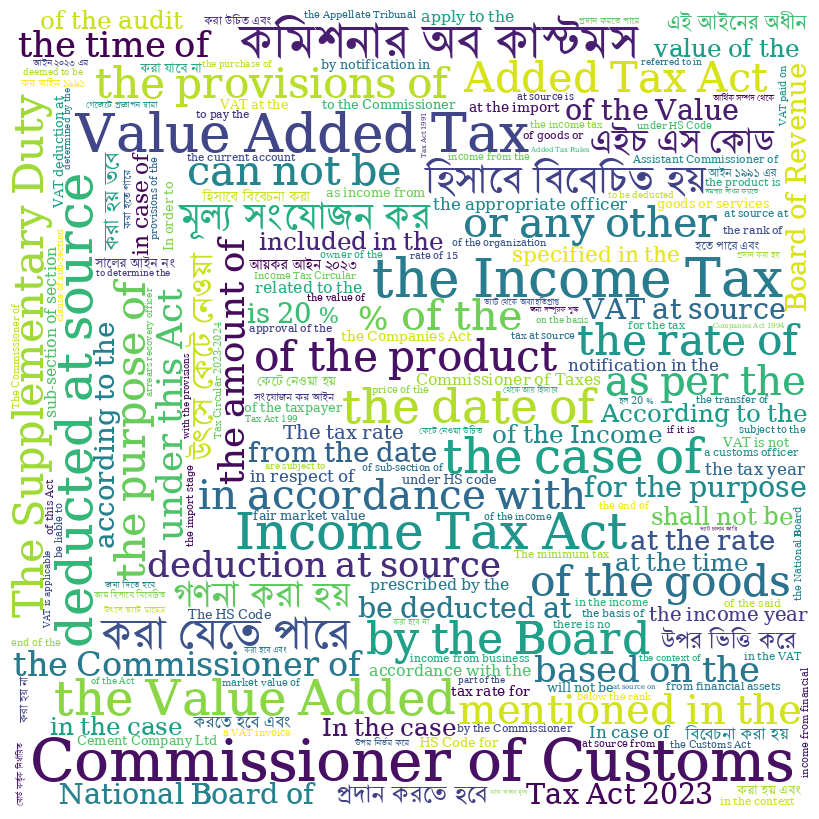

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Tokenizing the reviews into words
tokens = [nltk.word_tokenize(answer) for answer in cleaned_df['Answer'].dropna()]

# Generating trigrams for each tokenized review
trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

# Flattening the list of trigrams and converting each trigram tuple to a string
flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

# Counting the frequency of each trigram
trigram_frequency = Counter(flat_trigrams)

# Creating a word cloud from the trigram frequencies
wordcloud = WordCloud(width = 800, height = 800,
                      stopwords = set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
                      font_path="/content/Nikosh.ttf",
                      background_color ='white').generate_from_frequencies(trigram_frequency)

# Plotting the word cloud
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()


#English-Bangla Separated word cloud Trigrams for Answers (details no need)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


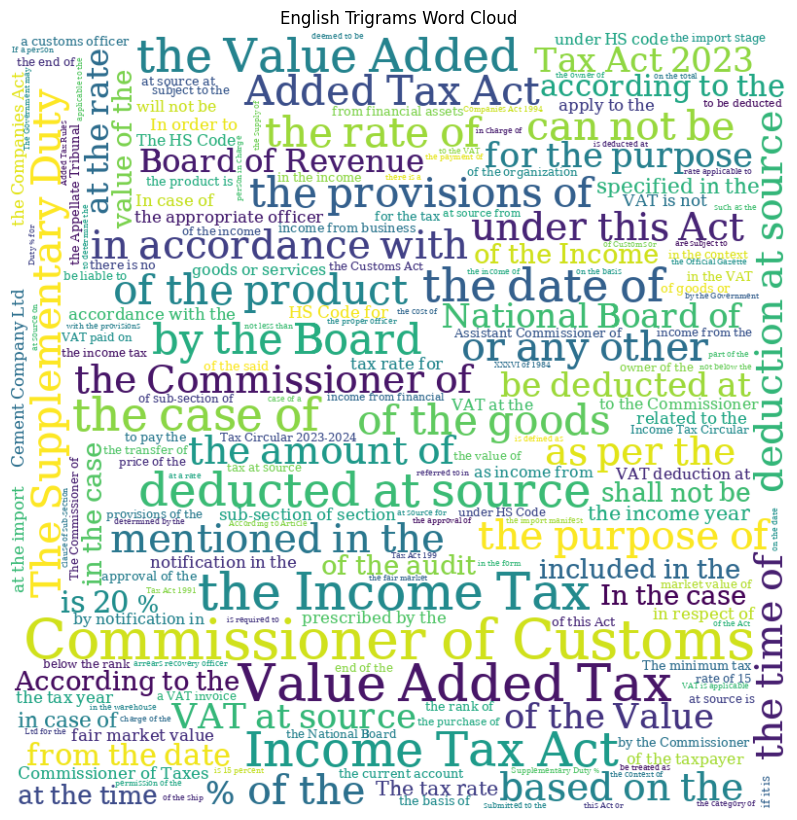

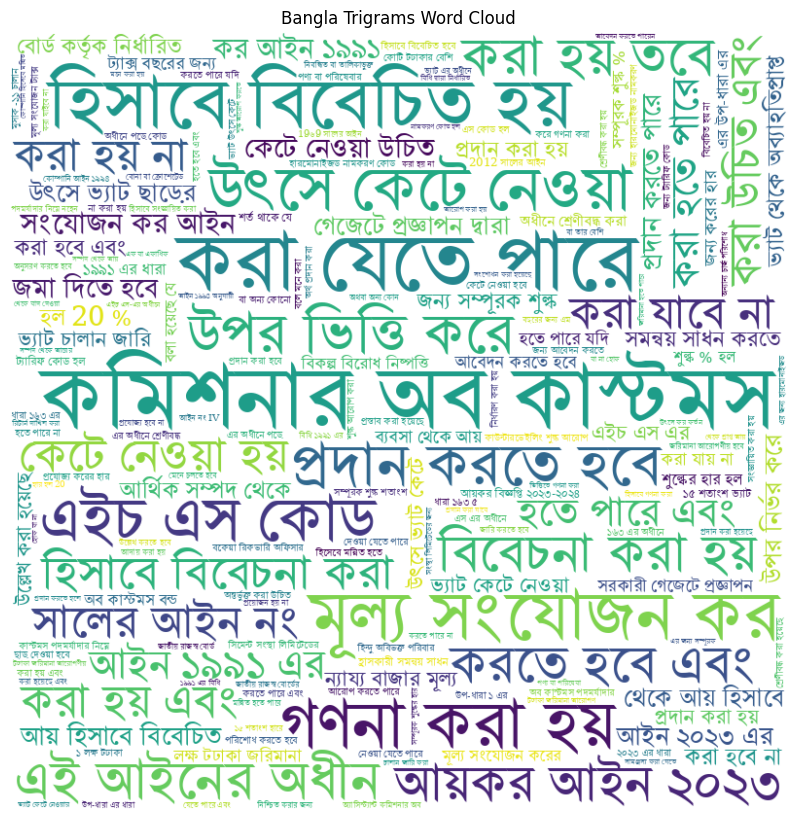

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Sample data loading (replace with your actual data loading method)
# data = pd.read_excel('/content/drive/MyDrive/Bangla FinGpt.xlsx')

# Example columns: 'Question' for text and 'Language' for language type
# Replace with actual column names as per your dataset
english_reviews = cleaned_df[cleaned_df['Type'] == 'English']['Answer'].dropna()
bangla_reviews = cleaned_df[cleaned_df['Type'] == 'Bangla']['Answer'].dropna()

def generate_trigram_wordcloud(reviews, font_path, title):
    # Tokenizing the reviews into words
    tokens = [nltk.word_tokenize(review) for review in reviews]

    # Generating trigrams for each tokenized review
    trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

    # Flattening the list of trigrams and converting each trigram tuple to a string
    flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

    # Counting the frequency of each trigram
    trigram_frequency = Counter(flat_trigrams)

    # Creating a word cloud from the trigram frequencies
    wordcloud = WordCloud(width=800, height=800,
                          stopwords=set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
                          font_path=font_path,
                          background_color='white').generate_from_frequencies(trigram_frequency)

    # Plotting the word cloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.tight_layout(pad=0)
    plt.show()

# Generate word clouds for English and Bangla texts
generate_trigram_wordcloud(english_reviews, '/content/Nikosh.ttf', 'English Trigrams Word Cloud')
generate_trigram_wordcloud(bangla_reviews, '/content/Nikosh.ttf', 'Bangla Trigrams Word Cloud')


#Word cloud trigram for Contexts (details no need)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


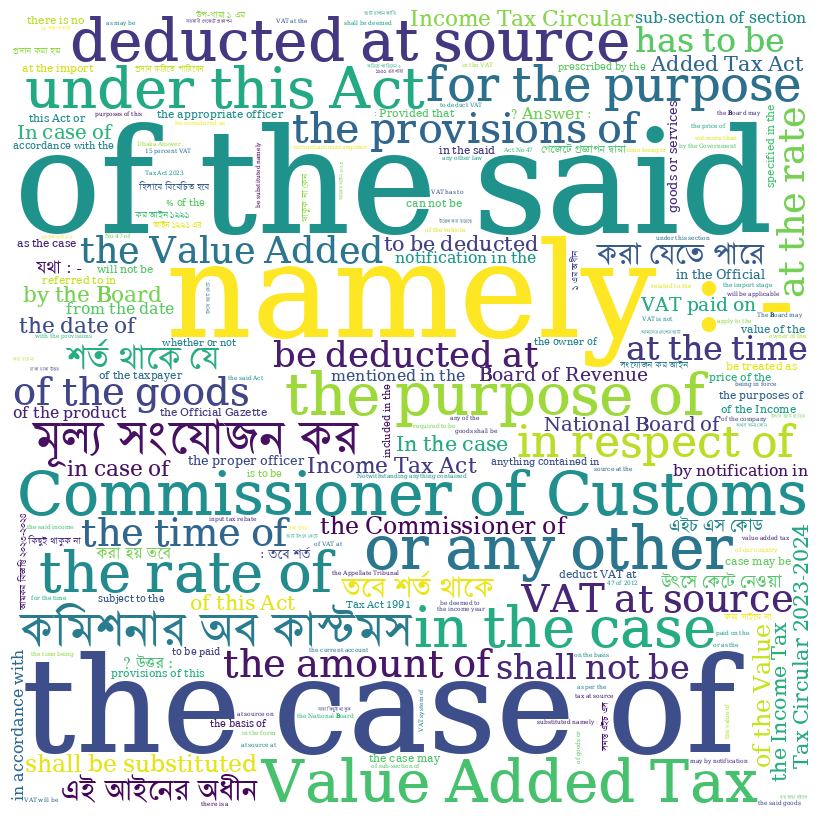

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Tokenizing the reviews into words
tokens = [nltk.word_tokenize(context) for context in cleaned_df['Context'].dropna()]

# Generating trigrams for each tokenized review
trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

# Flattening the list of trigrams and converting each trigram tuple to a string
flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

# Counting the frequency of each trigram
trigram_frequency = Counter(flat_trigrams)

# Creating a word cloud from the trigram frequencies
wordcloud = WordCloud(width = 800, height = 800,
                      stopwords = set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
                      font_path="/content/Nikosh.ttf",
                      background_color ='white').generate_from_frequencies(trigram_frequency)

# Plotting the word cloud
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()


#English-Bangla Separated word cloud Trigrams for Contexts (details no need)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


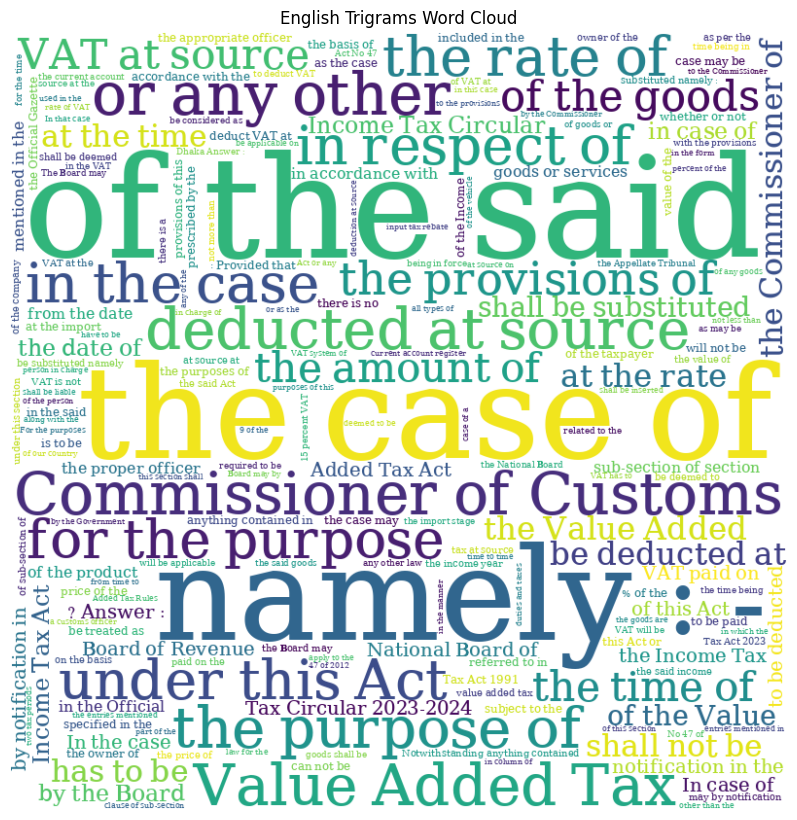

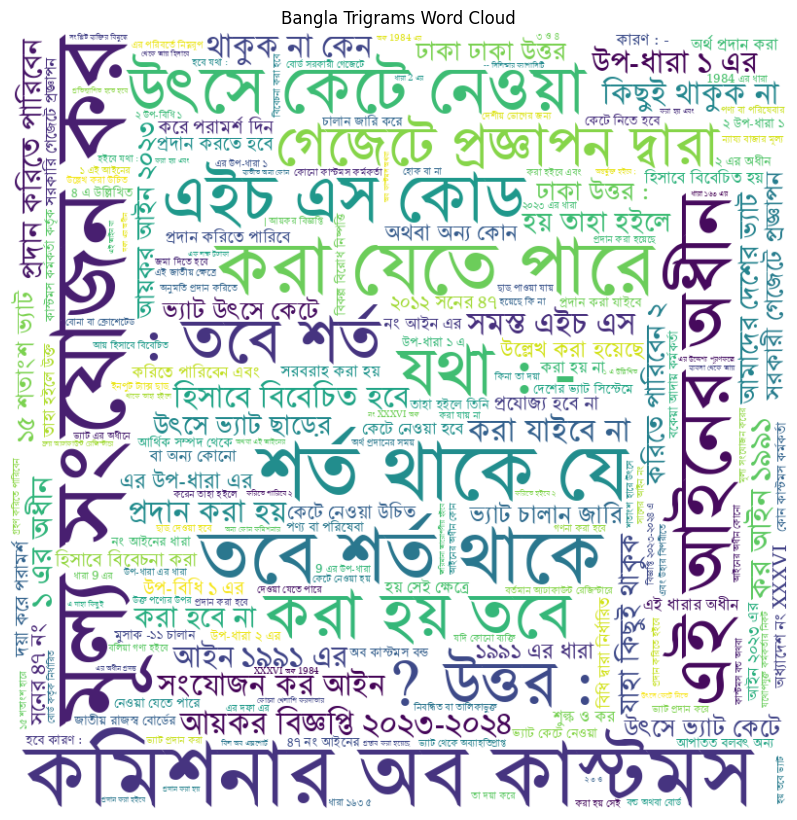

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Sample data loading (replace with your actual data loading method)
# data = pd.read_excel('/content/drive/MyDrive/Bangla FinGpt.xlsx')

# Example columns: 'Question' for text and 'Language' for language type
# Replace with actual column names as per your dataset
english_reviews = cleaned_df[cleaned_df['Type'] == 'English']['Context'].dropna()
bangla_reviews = cleaned_df[cleaned_df['Type'] == 'Bangla']['Context'].dropna()

def generate_trigram_wordcloud(reviews, font_path, title):
    # Tokenizing the reviews into words
    tokens = [nltk.word_tokenize(review) for review in reviews]

    # Generating trigrams for each tokenized review
    trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

    # Flattening the list of trigrams and converting each trigram tuple to a string
    flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

    # Counting the frequency of each trigram
    trigram_frequency = Counter(flat_trigrams)

    # Creating a word cloud from the trigram frequencies
    wordcloud = WordCloud(width=800, height=800,
                          stopwords=set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
                          font_path=font_path,
                          background_color='white').generate_from_frequencies(trigram_frequency)

    # Plotting the word cloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.tight_layout(pad=0)
    plt.show()

# Generate word clouds for English and Bangla texts
generate_trigram_wordcloud(english_reviews, '/content/Nikosh.ttf', 'English Trigrams Word Cloud')
generate_trigram_wordcloud(bangla_reviews, '/content/Nikosh.ttf', 'Bangla Trigrams Word Cloud')


#7.Overall three columns word cloud

A trigram word cloud is a visual representation of the frequency of trigrams—three consecutive words that often appear together within a text. While a traditional word cloud focuses on individual word frequency, a trigram word cloud highlights common three-word combinations, allowing deeper insights into the relationships between words, their context, and how they are used together.

In a trigram word cloud:

Larger trigrams represent those that appear more frequently in the text.
It reveals phrases or expressions that are frequently used.
It helps in understanding the structure, common patterns, and themes within the text, which may not be obvious when analyzing individual words.
This type of visualization is especially useful for understanding phrases, specific jargon, or common expressions in larger datasets, providing a richer contextual analysis compared to single-word clouds.

In our trigram word cloud, we have visualized both Bangla and English trigrams. By doing so, we can compare and contrast common phrases and expressions across these two languages, providing deeper insights into the structure and use of language in the dataset. This helps in identifying key patterns, themes, or expressions specific to each language, making it a powerful tool for bilingual analysis.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


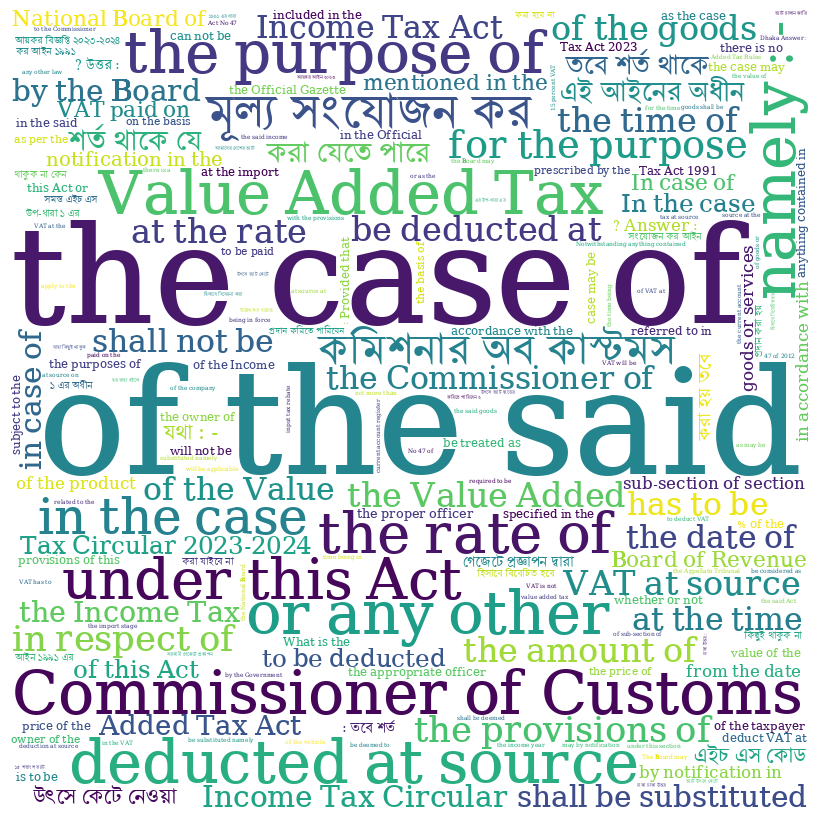

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

cleaned_df['CombinedText'] = cleaned_df[['Context', 'Question', 'Answer']].fillna('').agg(' '.join, axis=1)

# Tokenizing the combined text into words
tokens = [nltk.word_tokenize(text) for text in cleaned_df['CombinedText']]

# Generating trigrams for each tokenized review
trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

# Flattening the list of trigrams and converting each trigram tuple to a string
flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

# Counting the frequency of each trigram
trigram_frequency = Counter(flat_trigrams)

# Creating a word cloud from the trigram frequencies
wordcloud = WordCloud(width = 800, height = 800,
                      stopwords = set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
                      font_path="/content/Nikosh.ttf",
                      background_color ='white').generate_from_frequencies(trigram_frequency)

# Plotting the word cloud
plt.figure(figsize = (8, 8), facecolor = None)
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()



#7.English bangla separated overall Trigram word cloud

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


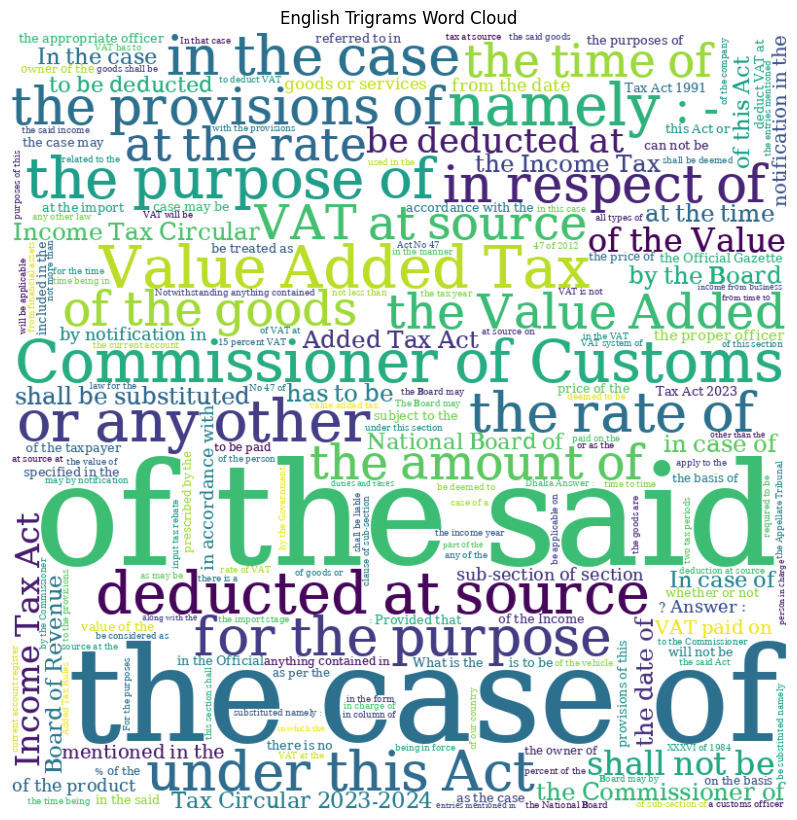

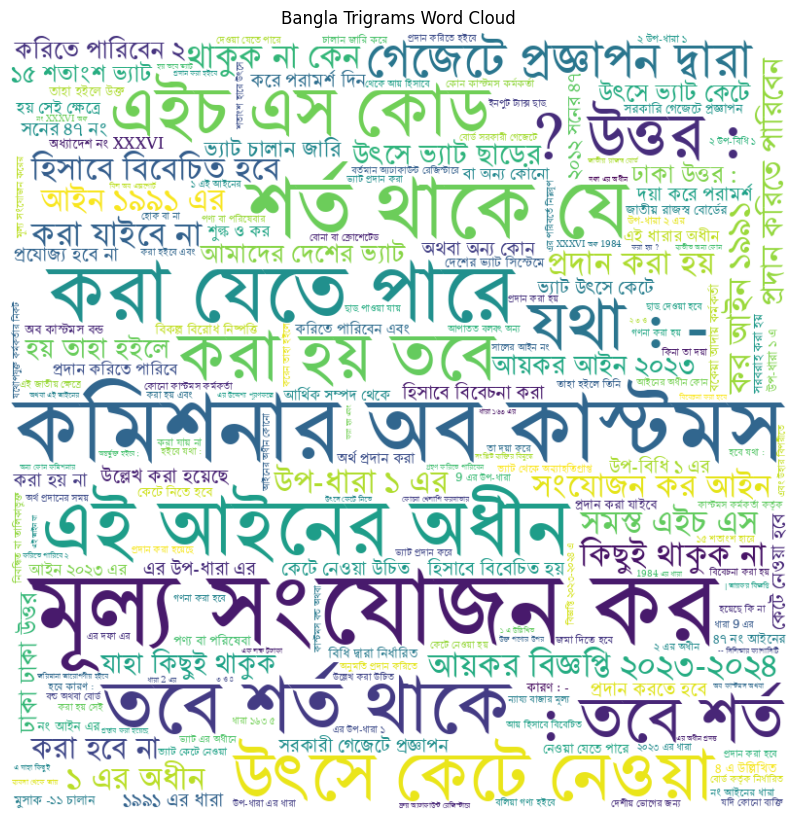

In [ ]:
from nltk import trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd
import re
from matplotlib import font_manager

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Function to detect language of a text
def detect_language(text):
    bangla_chars = re.findall(r'[\u0980-\u09FF]', text)  # Bangla Unicode range
    english_chars = re.findall(r'[a-zA-Z]', text)  # English alphabet
    if len(bangla_chars) > len(english_chars):
        return 'Bangla'
    else:
        return 'English'

# Function to generate and plot trigram word clouds
def generate_trigram_wordcloud(reviews, font_path, title):
    # Tokenizing the reviews into words
    tokens = [nltk.word_tokenize(review) for review in reviews]

    # Generating trigrams for each tokenized review
    trigrams_list = [list(trigrams(tokens)) for tokens in tokens]

    # Flattening the list of trigrams and converting each trigram tuple to a string
    flat_trigrams = [" ".join(trigram) for review_trigrams in trigrams_list for trigram in review_trigrams]

    # Counting the frequency of each trigram
    trigram_frequency = Counter(flat_trigrams)

    # Creating a word cloud from the trigram frequencies
    wordcloud = WordCloud(
        width=800, height=800,
        stopwords=set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
        font_path=font_path,
        background_color='white'
    ).generate_from_frequencies(trigram_frequency)

    # Plotting the word cloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.tight_layout(pad=0)
    plt.show()

# Sample DataFrame loading (replace this with your actual data loading method)
# data = pd.read_excel('/content/drive/MyDrive/Bangla FinGpt.xlsx')
# Assuming cleaned_df is the DataFrame containing 'Context', 'Question', 'Answer', etc.
cleaned_df['CombinedText'] = cleaned_df[['Context', 'Question', 'Answer']].fillna('').agg(' '.join, axis=1)

# Detect language and filter texts by language
cleaned_df['Language'] = cleaned_df['CombinedText'].apply(detect_language)

# Separate English and Bangla texts
english_texts = cleaned_df[cleaned_df['Language'] == 'English']['CombinedText']
bangla_texts = cleaned_df[cleaned_df['Language'] == 'Bangla']['CombinedText']

# Set the font path for Bangla text
bangla_font_path = '/content/Nikosh.ttf'  # Ensure this path is correct

# Generate word clouds for English and Bangla texts
generate_trigram_wordcloud(english_texts, "/content/Nikosh.ttf", 'English Trigrams Word Cloud')
generate_trigram_wordcloud(bangla_texts, bangla_font_path, 'Bangla Trigrams Word Cloud')


# English bangla separated overall Bigram word cloud

A bigram is a sequence of two consecutive words that appear together in a text. It is commonly used in natural language processing to identify word pair patterns, helping to understand how certain terms are used in context. By analyzing bigrams, we can detect recurring combinations of words, which may indicate commonly discussed topics or important relationships within the text.

In this dataset, bigram analysis for both English and Bangla data reveals recurring financial phrases. For English, common bigrams like "tax rate" or "VAT refund" indicate focus areas in finance. Similarly, Bangla bigrams such as "কর হার" (tax rate) highlight related topics, showcasing patterns of word usage in financial discussions.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


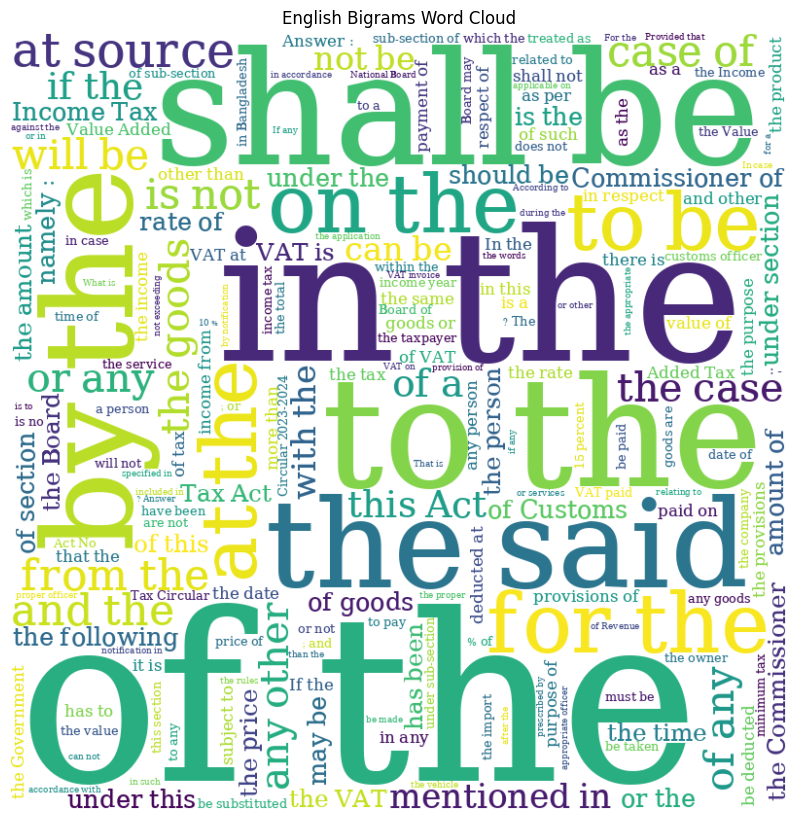

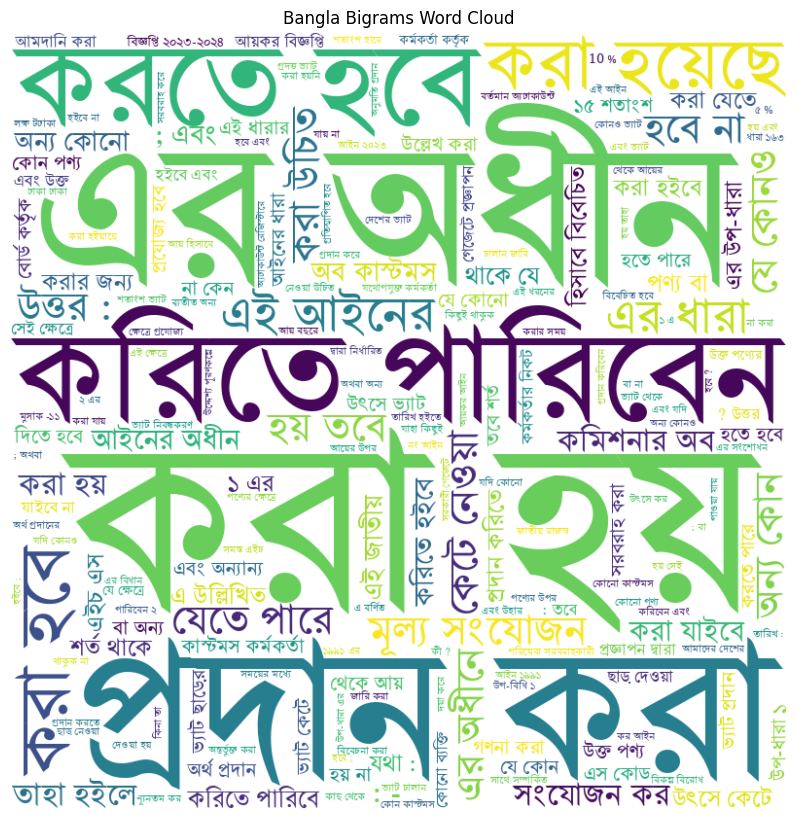

In [ ]:
from nltk import bigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd
import re
from matplotlib import font_manager

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Function to detect language of a text
def detect_language(text):
    bangla_chars = re.findall(r'[\u0980-\u09FF]', text)  # Bangla Unicode range
    english_chars = re.findall(r'[a-zA-Z]', text)  # English alphabet
    if len(bangla_chars) > len(english_chars):
        return 'Bangla'
    else:
        return 'English'

# Function to generate and plot bigram word clouds
def generate_bigram_wordcloud(reviews, font_path, title):
    # Tokenizing the reviews into words
    tokens = [nltk.word_tokenize(review) for review in reviews]

    # Generating bigrams for each tokenized review
    bigrams_list = [list(bigrams(tokens)) for tokens in tokens]

    # Flattening the list of bigrams and converting each bigram tuple to a string
    flat_bigrams = [" ".join(bigram) for review_bigrams in bigrams_list for bigram in review_bigrams]

    # Counting the frequency of each bigram
    bigram_frequency = Counter(flat_bigrams)

    # Creating a word cloud from the bigram frequencies
    wordcloud = WordCloud(
        width=800, height=800,
        stopwords=set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
        font_path=font_path,
        background_color='white'
    ).generate_from_frequencies(bigram_frequency)

    # Plotting the word cloud
    plt.figure(figsize=(8, 8), facecolor=None)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    plt.title(title)
    plt.tight_layout(pad=0)
    plt.show()

# Sample DataFrame loading (replace this with your actual data loading method)
# data = pd.read_excel('/content/drive/MyDrive/Bangla FinGpt.xlsx')
# Assuming cleaned_df is the DataFrame containing 'Context', 'Question', 'Answer', etc.
cleaned_df['CombinedText'] = cleaned_df[['Context', 'Question', 'Answer']].fillna('').agg(' '.join, axis=1)

# Detect language and filter texts by language
cleaned_df['Language'] = cleaned_df['CombinedText'].apply(detect_language)

# Separate English and Bangla texts
english_texts = cleaned_df[cleaned_df['Language'] == 'English']['CombinedText']
bangla_texts = cleaned_df[cleaned_df['Language'] == 'Bangla']['CombinedText']

# Set the font path for Bangla text
bangla_font_path = '/content/Nikosh.ttf'  # Ensure this path is correct

# Generate word clouds for English and Bangla texts
generate_bigram_wordcloud(english_texts, "/content/Nikosh.ttf", 'English Bigrams Word Cloud')
generate_bigram_wordcloud(bangla_texts, bangla_font_path, 'Bangla Bigrams Word Cloud')


# Bigram And Trigram Word Cloud separatly for Bangla and English

A trigram word cloud displays the frequency of three-word combinations, revealing common phrases and contextual patterns within a text. Trigrams, which consist of three consecutive words, provide insights into frequent expressions and their usage in context. This visualization highlights how certain trios of words often appear together, offering a deeper understanding of language use beyond individual word frequencies. By comparing trigrams in Bangla and English, we uncover key phrases and expressions unique to each language, enhancing our insight into linguistic structures and usage.

Similarly, bigram analysis focuses on pairs of consecutive words, representing recurring combinations that indicate common topics or relationships. Bigrams, consisting of two consecutive words, help identify significant patterns in word usage. In our dataset, English bigrams like "tax rate" and Bangla bigrams such as "কর হার" (tax rate) illustrate prevalent financial terms. Together, trigram and bigram analyses provide a comprehensive view of word patterns and themes, aiding in the nuanced understanding of language in financial contexts.

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


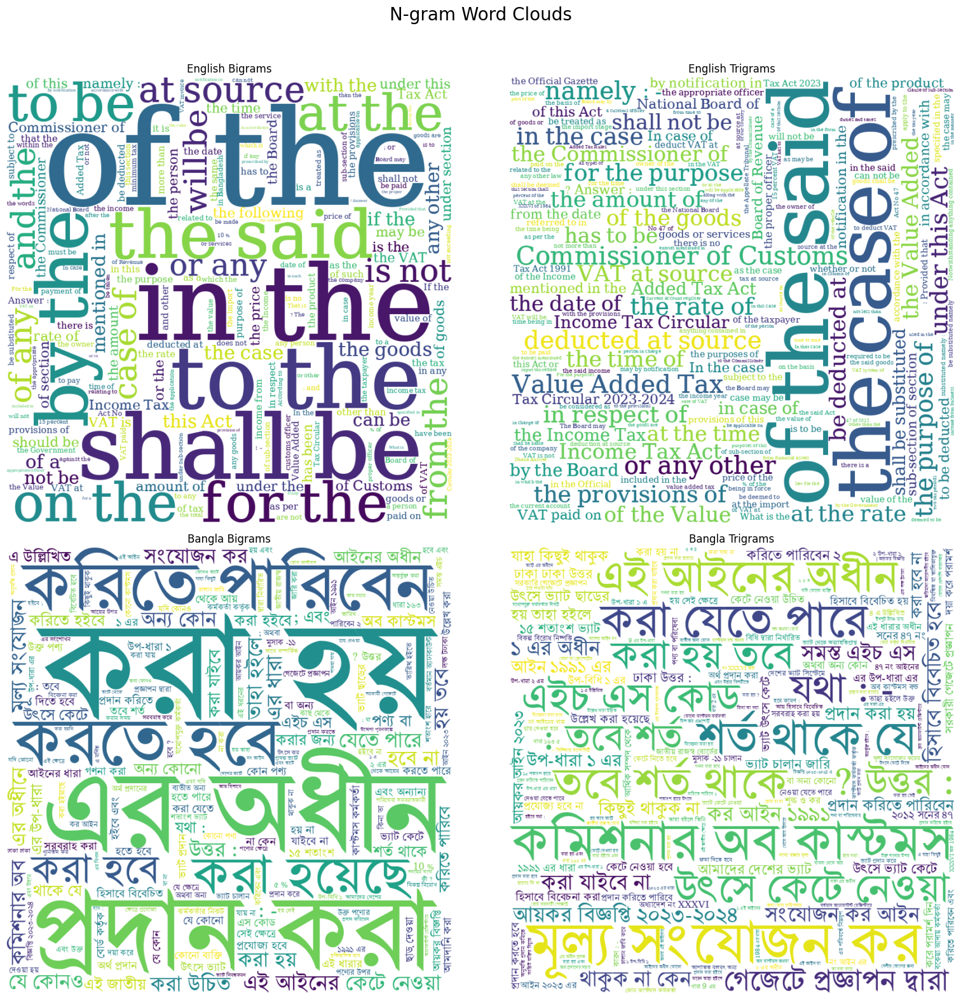

In [ ]:
from nltk import bigrams, trigrams
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from collections import Counter
import pandas as pd
import re
from matplotlib import font_manager

# Ensure the necessary NLTK tokenizers are available
nltk.download('punkt')

# Function to detect language of a text
def detect_language(text):
    bangla_chars = re.findall(r'[\u0980-\u09FF]', text)  # Bangla Unicode range
    english_chars = re.findall(r'[a-zA-Z]', text)  # English alphabet
    if len(bangla_chars) > len(english_chars):
        return 'Bangla'
    else:
        return 'English'

# Function to generate and plot word clouds for bigrams and trigrams
def generate_ngram_wordcloud(reviews, font_path, title, n_gram):
    # Tokenizing the reviews into words
    tokens = [nltk.word_tokenize(review) for review in reviews]

    # Generating n-grams for each tokenized review
    if n_gram == 2:
        ngram_list = [list(bigrams(tokens)) for tokens in tokens]
    elif n_gram == 3:
        ngram_list = [list(trigrams(tokens)) for tokens in tokens]
    else:
        raise ValueError("Only bigrams and trigrams are supported")

    # Flattening the list of n-grams and converting each n-gram tuple to a string
    flat_ngrams = [" ".join(ngram) for review_ngrams in ngram_list for ngram in review_ngrams]

    # Counting the frequency of each n-gram
    ngram_frequency = Counter(flat_ngrams)

    # Creating a word cloud from the n-gram frequencies
    wordcloud = WordCloud(
        width=800, height=800,
        stopwords=set(['the', 'is', 'i', 'it', 'but', 'and', 'to', 'of', 'in', 'for', 'on', 'with']),
        font_path=font_path,
        background_color='white'
    ).generate_from_frequencies(ngram_frequency)

    # Plotting the word cloud
    return wordcloud

# Sample DataFrame loading (replace this with your actual data loading method)
# data = pd.read_excel('/content/drive/MyDrive/Bangla FinGpt.xlsx')
# Assuming cleaned_df is the DataFrame containing 'Context', 'Question', 'Answer', etc.
cleaned_df['CombinedText'] = cleaned_df[['Context', 'Question', 'Answer']].fillna('').agg(' '.join, axis=1)

# Detect language and filter texts by language
cleaned_df['Language'] = cleaned_df['CombinedText'].apply(detect_language)

# Separate English and Bangla texts
english_texts = cleaned_df[cleaned_df['Language'] == 'English']['CombinedText']
bangla_texts = cleaned_df[cleaned_df['Language'] == 'Bangla']['CombinedText']

# Set the font path for Bangla text
bangla_font_path = '/content/Nikosh.ttf'  # Ensure this path is correct

# Generate word clouds for English and Bangla texts
english_bigram_wc = generate_ngram_wordcloud(english_texts,'/content/Nikosh.ttf', 'English Bigrams Word Cloud', n_gram=2)
english_trigram_wc = generate_ngram_wordcloud(english_texts,'/content/Nikosh.ttf', 'English Trigrams Word Cloud', n_gram=3)
bangla_bigram_wc = generate_ngram_wordcloud(bangla_texts, bangla_font_path, 'Bangla Bigrams Word Cloud', n_gram=2)
bangla_trigram_wc = generate_ngram_wordcloud(bangla_texts, bangla_font_path, 'Bangla Trigrams Word Cloud', n_gram=3)

# Plotting the word clouds in subplots
fig, axs = plt.subplots(2, 2, figsize=(16, 16))
fig.suptitle('N-gram Word Clouds', fontsize=20, ha='center')

# English bigrams
axs[0, 0].imshow(english_bigram_wc, interpolation='bilinear')
axs[0, 0].axis("off")
axs[0, 0].set_title('English Bigrams')

# English trigrams
axs[0, 1].imshow(english_trigram_wc, interpolation='bilinear')
axs[0, 1].axis("off")
axs[0, 1].set_title('English Trigrams')

# Bangla bigrams
axs[1, 0].imshow(bangla_bigram_wc, interpolation='bilinear')
axs[1, 0].axis("off")
axs[1, 0].set_title('Bangla Bigrams')

# Bangla trigrams
axs[1, 1].imshow(bangla_trigram_wc, interpolation='bilinear')
axs[1, 1].axis("off")
axs[1, 1].set_title('Bangla Trigrams')

plt.tight_layout(rect=[0, 0, 1, 0.96])  # Adjust layout to prevent overlap
plt.show()


# Most frequent Bigram  Count

In [ ]:
import pandas as pd
import nltk
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from nltk.util import bigrams
from collections import Counter
import re

# Make sure necessary NLTK data is downloaded
nltk.download('stopwords')
nltk.download('punkt')  # Download the punkt tokenizer

# Function to preprocess text (removes punctuation and non-alphabetic characters)
def preprocess_text(text, language):
    if language == 'Bangla':
        text = re.sub(r'[^\u0980-\u09FF\s]', '', text)  # Keep only Bangla characters and spaces
    else:
        text = re.sub(r'[^a-zA-Z\s]', '', text)  # Keep only English letters and spaces
    return text

# Function to generate and clean bigrams from text
def get_cleaned_bigrams(text, min_freq):
    tokens = nltk.word_tokenize(text)
    bigram_list = list(bigrams(tokens))
    bigram_freq = Counter(bigram_list)

    # Filter out bigrams with frequency less than min_freq
    filtered_bigrams = {k: v for k, v in bigram_freq.items() if v > min_freq}

    return filtered_bigrams

# Load your dataset
df = pd.read_excel('/content/BanglaFinGpt_updated.xlsx')  # Update with your dataset path

# Concatenate Context, Question, and Answer for Bangla and English text
bangla_text = ' '.join(df[df['Type'] == 'Bangla']['Context'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Question'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Answer'].astype(str))

english_text = ' '.join(df[df['Type'] == 'English']['Context'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Question'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Answer'].astype(str))

# Preprocess and clean the texts
cleaned_bangla_text = preprocess_text(bangla_text, 'Bangla')
cleaned_english_text = preprocess_text(english_text, 'English')

# Get bigrams from the cleaned texts
bangla_bigrams_freq = get_cleaned_bigrams(cleaned_bangla_text, min_freq=5)  # Adjust min_freq as needed
english_bigrams_freq = get_cleaned_bigrams(cleaned_english_text, min_freq=5)  # Adjust min_freq as needed

# Convert the bigram frequencies to DataFrames
bangla_bigrams_df = pd.DataFrame(bangla_bigrams_freq.items(), columns=['Bigram', 'Count'])
bangla_bigrams_df['Bigram'] = [' '.join(bigram) for bigram in bangla_bigrams_df['Bigram']]
bangla_bigrams_df = bangla_bigrams_df.sort_values(by='Count', ascending=False).head(15)  # Show top 15

english_bigrams_df = pd.DataFrame(english_bigrams_freq.items(), columns=['Bigram', 'Count'])
english_bigrams_df['Bigram'] = [' '.join(bigram) for bigram in english_bigrams_df['Bigram']]
english_bigrams_df = english_bigrams_df.sort_values(by='Count', ascending=False).head(15)  # Show top 15

# Function to create bar plot for bigrams
def create_bar_plot(df, x, title):
    return go.Bar(
        x=df[x],
        y=df['Count'],
        text=df['Count'],
        textposition='auto',
        name=title,
        marker=dict(color='#636EFA')  # You can choose different colors
    )

# Create subplots
fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=('Top 15 Bangla Bigrams', 'Top 15 English Bigrams'),
    shared_yaxes=True
)

# Add traces for each subplot
fig.add_trace(create_bar_plot(bangla_bigrams_df, 'Bigram', 'Bangla Bigrams'), row=1, col=1)
fig.add_trace(create_bar_plot(english_bigrams_df, 'Bigram', 'English Bigrams'), row=1, col=2)

# Update layout
fig.update_layout(
    height=800,
    width=1200,
    title_text='Top 15 Bigrams (Bangla and English)',
    title_x=0.5,  # Center the title
    showlegend=False,
    template="simple_white"
)

# Show the figure
fig.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


# Most Frequent Trigram Count

In [ ]:
import pandas as pd
import nltk
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from nltk.util import trigrams
from collections import Counter
import re

# Make sure necessary NLTK data is downloaded
nltk.download('stopwords')

# Function to preprocess text (removes punctuation and non-alphabetic characters)
def preprocess_text(text, language):
    if language == 'Bangla':
        text = re.sub(r'[^\u0980-\u09FF\s]', '', text)  # Keep only Bangla characters and spaces
    else:
        text = re.sub(r'[^a-zA-Z\s]', '', text)  # Keep only English letters and spaces
    return text

# Function to generate and clean trigrams from text
def get_cleaned_ngrams(text, n_grams, min_freq):
    tokens = nltk.word_tokenize(text)

    if n_grams == 3:
        ngram_list = list(trigrams(tokens))
    else:
        raise ValueError("Only 3-grams are supported")

    ngram_freq = Counter(ngram_list)

    # Filter out n-grams with frequency less than min_freq
    filtered_ngrams = {k: v for k, v in ngram_freq.items() if v > min_freq}

    return filtered_ngrams

# Load your dataset
df = pd.read_excel('/content/BanglaFinGpt_updated.xlsx')  # Update with your dataset path

# Concatenate Context, Question, and Answer for Bangla and English text
bangla_text = ' '.join(df[df['Type'] == 'Bangla']['Context'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Question'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Answer'].astype(str))

english_text = ' '.join(df[df['Type'] == 'English']['Context'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Question'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Answer'].astype(str))

# Preprocess and clean the texts
cleaned_bangla_text = preprocess_text(bangla_text, 'Bangla')
cleaned_english_text = preprocess_text(english_text, 'English')

# Get trigrams from the cleaned texts
bangla_trigrams_freq = get_cleaned_ngrams(cleaned_bangla_text, n_grams=3, min_freq=5)  # Adjust min_freq as needed
english_trigrams_freq = get_cleaned_ngrams(cleaned_english_text, n_grams=3, min_freq=5)  # Adjust min_freq as needed

# Convert the trigram frequencies to DataFrames
def ngram_to_df(ngram_freq):
    df = pd.DataFrame(ngram_freq.items(), columns=['Trigram', 'Count'])
    df['Trigram'] = [' '.join(trigram) for trigram in df['Trigram']]
    return df

bangla_trigrams_df = ngram_to_df(bangla_trigrams_freq).sort_values(by='Count', ascending=False).head(15)
english_trigrams_df = ngram_to_df(english_trigrams_freq).sort_values(by='Count', ascending=False).head(15)

# Function to create bar plot for trigrams
def bar_plot(df, x, y, title):
    return go.Bar(x=df[x], y=df[y], text=df[y], textposition='outside', marker_color='#636EFA')

# Create subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=[
    'Top 15 Bangla Trigrams by Frequency',
    'Top 15 English Trigrams by Frequency',
    'Top 15 Bangla Trigrams by Frequency',  # Adjust titles if needed
    'Top 15 English Trigrams by Frequency'  # Adjust titles if needed
])

# Add trigram plots
fig.add_trace(bar_plot(bangla_trigrams_df, 'Trigram', 'Count', 'Top 15 Bangla Trigrams by Frequency'), row=1, col=1)
fig.add_trace(bar_plot(english_trigrams_df, 'Trigram', 'Count', 'Top 15 English Trigrams by Frequency'), row=1, col=2)

# Adjust layout
fig.update_layout(
    height=800,
    width=1200,
    title_text='Top 15 Trigrams (Bangla and English)',
    title_x=0.5,  # Center the title
    showlegend=False,
    template="simple_white"
)


# Show plot
fig.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Bigram And Trigram Distrubution Separately(English and Bangla)
The figure depicts the Top 15 Bigrams and Trigrams in both Bangla and English, highlighting frequently occurring word pairs (bigrams) and word triples (trigrams) from a dataset likely related to finance.The figure reflects a dataset dominated by structured, repetitive language, likely extracted from legal, regulatory, or financial documents, showcasing key patterns in both Bangla and English.

In [ ]:
import pandas as pd
import nltk
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from nltk.util import bigrams, trigrams
from collections import Counter
import re

# Make sure necessary NLTK data is downloaded
nltk.download('stopwords')

# Function to preprocess text (removes punctuation and non-alphabetic characters)
def preprocess_text(text, language):
    if language == 'Bangla':
        text = re.sub(r'[^\u0980-\u09FF\s]', '', text)  # Keep only Bangla characters and spaces
    else:
        text = re.sub(r'[^a-zA-Z\s]', '', text)  # Keep only English letters and spaces
    return text

# Function to generate and clean bigrams from text
def get_cleaned_bigrams(text, min_freq):
    tokens = nltk.word_tokenize(text)
    bigram_list = list(bigrams(tokens))
    bigram_freq = Counter(bigram_list)

    # Filter out bigrams with frequency less than min_freq
    filtered_bigrams = {k: v for k, v in bigram_freq.items() if v > min_freq}

    return filtered_bigrams

# Function to generate and clean trigrams from text
def get_cleaned_ngrams(text, n_grams, min_freq):
    tokens = nltk.word_tokenize(text)

    if n_grams == 2:
        ngram_list = list(bigrams(tokens))
    elif n_grams == 3:
        ngram_list = list(trigrams(tokens))
    else:
        raise ValueError("Only 2-grams and 3-grams are supported")

    ngram_freq = Counter(ngram_list)

    # Filter out n-grams with frequency less than min_freq
    filtered_ngrams = {k: v for k, v in ngram_freq.items() if v > min_freq}

    return filtered_ngrams

# Load your dataset
df = pd.read_excel('/content/BanglaFinGpt_updated.xlsx')  # Update with your dataset path

# Concatenate Context, Question, and Answer for Bangla and English text
bangla_text = ' '.join(df[df['Type'] == 'Bangla']['Context'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Question'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Answer'].astype(str))

english_text = ' '.join(df[df['Type'] == 'English']['Context'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Question'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Answer'].astype(str))

# Preprocess and clean the texts
cleaned_bangla_text = preprocess_text(bangla_text, 'Bangla')
cleaned_english_text = preprocess_text(english_text, 'English')

# Get bigrams and trigrams from the cleaned texts
bangla_bigrams_freq = get_cleaned_bigrams(cleaned_bangla_text, min_freq=5)  # Adjust min_freq as needed
english_bigrams_freq = get_cleaned_bigrams(cleaned_english_text, min_freq=5)  # Adjust min_freq as needed

bangla_trigrams_freq = get_cleaned_ngrams(cleaned_bangla_text, n_grams=3, min_freq=5)  # Adjust min_freq as needed
english_trigrams_freq = get_cleaned_ngrams(cleaned_english_text, n_grams=3, min_freq=5)  # Adjust min_freq as needed

# Convert the bigram frequencies to DataFrames
def ngram_to_df(ngram_freq, n_grams):
    df = pd.DataFrame(ngram_freq.items(), columns=[f'{n_grams}-gram', 'Count'])
    df[f'{n_grams}-gram'] = [' '.join(gram) for gram in df[f'{n_grams}-gram']]
    return df

bangla_bigrams_df = ngram_to_df(bangla_bigrams_freq, 2)
english_bigrams_df = ngram_to_df(english_bigrams_freq, 2)

bangla_trigrams_df = ngram_to_df(bangla_trigrams_freq, 3)
english_trigrams_df = ngram_to_df(english_trigrams_freq, 3)

# Get the top 15 bigrams and trigrams for visualization
bangla_bigrams_df = bangla_bigrams_df.sort_values(by='Count', ascending=False).head(15)
english_bigrams_df = english_bigrams_df.sort_values(by='Count', ascending=False).head(15)

bangla_trigrams_df = bangla_trigrams_df.sort_values(by='Count', ascending=False).head(15)
english_trigrams_df = english_trigrams_df.sort_values(by='Count', ascending=False).head(15)

# Function to create bar plot for n-grams
def bar_plot(df, x, y, title):
    return go.Bar(x=df[x], y=df[y], text=df[y], textposition='outside', marker_color='#636EFA')

# Create subplots
fig = make_subplots(rows=2, cols=2, subplot_titles=[
    'Top 15 Bangla Bigrams by Frequency',
    'Top 15 English Bigrams by Frequency',
    'Top 15 Bangla Trigrams by Frequency',
    'Top 15 English Trigrams by Frequency'
])

# Add bigram plots
fig.add_trace(bar_plot(bangla_bigrams_df, '2-gram', 'Count', 'Top 15 Bangla Bigrams by Frequency'), row=1, col=1)
fig.add_trace(bar_plot(english_bigrams_df, '2-gram', 'Count', 'Top 15 English Bigrams by Frequency'), row=1, col=2)

# Add trigram plots
fig.add_trace(bar_plot(bangla_trigrams_df, '3-gram', 'Count', 'Top 15 Bangla Trigrams by Frequency'), row=2, col=1)
fig.add_trace(bar_plot(english_trigrams_df, '3-gram', 'Count', 'Top 15 English Trigrams by Frequency'), row=2, col=2)

# Adjust layout
fig.update_layout(
    height=800,
    width=1200,
    title_text='Top 15 Bigrams and Trigrams (Bangla and English)',
    title_x=0.5,  # Center the title
    showlegend=False,
    template="simple_white"
)

# Show plot
fig.show()


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


# Violin Plot Of Trigram And Bigram
The violin plots of bigrams and trigrams reveal notable differences between Bangla and English. English bigrams and trigrams generally exhibit higher frequencies and wider distributions, indicating a greater diversity in word combinations compared to Bangla, which shows lower overall frequencies and narrower distributions. This variance may be attributed to differences in grammatical structures, vocabulary size, and corpus diversity between the languages. English’s more flexible word order and larger vocabulary contribute to its broader range of combinations. These insights are valuable for improving natural language processing tasks such as language modeling, machine translation, and text analysis, by tailoring models to the specific patterns and nuances of each language.

In [ ]:
import pandas as pd
import nltk
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from nltk.util import bigrams, trigrams
from collections import Counter
import re

# Make sure necessary NLTK data is downloaded
nltk.download('stopwords')

# Function to preprocess text (removes punctuation and non-alphabetic characters)
def preprocess_text(text, language):
    if language == 'Bangla':
        text = re.sub(r'[^\u0980-\u09FF\s]', '', text)  # Keep only Bangla characters and spaces
    else:
        text = re.sub(r'[^a-zA-Z\s]', '', text)  # Keep only English letters and spaces
    return text

# Function to generate and clean n-grams from text
def get_cleaned_ngrams(text, n_grams, min_freq):
    tokens = nltk.word_tokenize(text)

    if n_grams == 2:
        ngram_list = list(bigrams(tokens))
    elif n_grams == 3:
        ngram_list = list(trigrams(tokens))
    else:
        raise ValueError("Only 2-grams and 3-grams are supported")

    ngram_freq = Counter(ngram_list)

    # Filter out n-grams with frequency less than min_freq
    filtered_ngrams = {k: v for k, v in ngram_freq.items() if v > min_freq}

    return filtered_ngrams

# Load your dataset
df = pd.read_excel('/content/BanglaFinGpt_updated.xlsx')  # Update with your dataset path

# Concatenate Context, Question, and Answer for Bangla and English text
bangla_text = ' '.join(df[df['Type'] == 'Bangla']['Context'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Question'].astype(str) + ' ' +
                       df[df['Type'] == 'Bangla']['Answer'].astype(str))

english_text = ' '.join(df[df['Type'] == 'English']['Context'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Question'].astype(str) + ' ' +
                        df[df['Type'] == 'English']['Answer'].astype(str))

# Preprocess and clean the texts
cleaned_bangla_text = preprocess_text(bangla_text, 'Bangla')
cleaned_english_text = preprocess_text(english_text, 'English')

# Get bigrams and trigrams from the cleaned texts
bangla_bigrams_freq = get_cleaned_ngrams(cleaned_bangla_text, n_grams=2, min_freq=5)  # Adjust min_freq as needed
english_bigrams_freq = get_cleaned_ngrams(cleaned_english_text, n_grams=2, min_freq=5)  # Adjust min_freq as needed

bangla_trigrams_freq = get_cleaned_ngrams(cleaned_bangla_text, n_grams=3, min_freq=5)  # Adjust min_freq as needed
english_trigrams_freq = get_cleaned_ngrams(cleaned_english_text, n_grams=3, min_freq=5)  # Adjust min_freq as needed

# Convert the n-gram frequencies to DataFrames
def ngram_to_df(ngram_freq, n_grams):
    df = pd.DataFrame(ngram_freq.items(), columns=[f'{n_grams}-gram', 'Count'])
    df[f'{n_grams}-gram'] = [' '.join(gram) for gram in df[f'{n_grams}-gram']]
    return df

bangla_bigrams_df = ngram_to_df(bangla_bigrams_freq, 2)
english_bigrams_df = ngram_to_df(english_bigrams_freq, 2)

bangla_trigrams_df = ngram_to_df(bangla_trigrams_freq, 3)
english_trigrams_df = ngram_to_df(english_trigrams_freq, 3)

# Combine data into a single DataFrame for plotting
def combine_data_for_plotting(*dfs):
    combined_df = pd.concat(dfs, keys=['Bangla Bigrams', 'English Bigrams', 'Bangla Trigrams', 'English Trigrams'])
    combined_df = combined_df.reset_index(level=0).rename(columns={'level_0': 'Ngram Type'})
    return combined_df

combined_df = combine_data_for_plotting(bangla_bigrams_df, english_bigrams_df, bangla_trigrams_df, english_trigrams_df)

# Function to plot violin plots in subplots
def subplot_violin_plot(df):
    fig = make_subplots(rows=2, cols=2,
                        subplot_titles=["Bangla Bigrams", "English Bigrams", "Bangla Trigrams", "English Trigrams"])

    # Bangla Bigrams
    fig.add_trace(
        go.Violin(y=df[df['Ngram Type'] == 'Bangla Bigrams']['Count'],
                  box_visible=True, line_color='blue', meanline_visible=True, name="Bangla Bigrams"),
        row=1, col=1
    )

    # English Bigrams
    fig.add_trace(
        go.Violin(y=df[df['Ngram Type'] == 'English Bigrams']['Count'],
                  box_visible=True, line_color='red', meanline_visible=True, name="English Bigrams"),
        row=1, col=2
    )

    # Bangla Trigrams
    fig.add_trace(
        go.Violin(y=df[df['Ngram Type'] == 'Bangla Trigrams']['Count'],
                  box_visible=True, line_color='green', meanline_visible=True, name="Bangla Trigrams"),
        row=2, col=1
    )

    # English Trigrams
    fig.add_trace(
        go.Violin(y=df[df['Ngram Type'] == 'English Trigrams']['Count'],
                  box_visible=True, line_color='purple', meanline_visible=True, name="English Trigrams"),
        row=2, col=2
    )

    # Update layout
    fig.update_layout(title_text="Violin Plot of Bigrams and Trigrams for Bangla and English",
                      showlegend=False, template="plotly_white")

    fig.show()

# Plot violin plots with subplots for bigrams and trigrams
subplot_violin_plot(combined_df)


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
